# Рынок заведений общественного питания Москвы

*Учебный проект Яндекс Практикума по теме «Презентация исследования»*

**Цель**: определить место для открытия нового заведения общественного питания (кофейни).

Данные: датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. 

Заказчик: инвесторы из частного фонда.

**Задачи**:
- EDA: выявить любые общие особенности рынка заведений общественного питания,
- выявить особенности рынка кофеен,
- оценить перспективы для открытия кофейни и дать рекомендации по району для ее открытия.

Приложение: [презентация](https://drive.google.com/file/d/1bU_SbNQJAocP7xx5ZvxqvM1xAstyO-CW/view?usp=sharing)

## Оглавление
1. Обзор данных
    * 1.1 пропуски
    * 1.2 дубликаты
    * 1.3 добавление столбцов
    * 1.5 функция для графиков
    * 1.6 вывод
2. EDA
    * 2.1 категории заведений
    * 2.2 сетевые заведения
    * 2.3 районы
    * 2.4 рейтинги
    * 2.5 улицы
    * 2.6 цены
    * 2.7 вывод
3. Анализ кофеен
    * 3.1 количество кофеен
    * 3.2 характеристики
    * 3.3 вывод
4. Итог и рекомендации

## 1 Обзор данных

In [1]:
import json
import folium
import pandas as pd
import plotly.express as px

from plotly import graph_objects as go
from folium import Map, Marker
from folium import Map, Choropleth
from folium.plugins import MarkerCluster
from folium.features import GeoJsonTooltip

pd.set_option('mode.chained_assignment', None)

moscow_lat, moscow_lng = 55.751244, 37.618423

Откроем датасет и сохраним данные в переменной.

In [2]:
data = pd.read_csv('moscow_places.csv')
state_geo = 'admin_level_geomap.geojson'
    
display(data.head())
data.info()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


### 1.1 пропуски

Оценим количество пропусков в данных.

In [3]:
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Имеются пропуски в столбцах с часами работы и количеством посадочных мест, а также в столбцах с оценкой цен в заведении. Заполнение пропусков усредненными данными в данном случае нецелесообразно, поэтому заполним пропуски заглушками для удобства работы (изменение типов данных, построение графиков и пр.)

Заполним пропуски в столбцах 4, 8 и 9 с информцией о режиме работы, категориях цен и средней стоимости заказа значениями "неизвестно".

In [4]:
for i in ['hours', 'price', 'avg_bill']:
    data[i] = data[i].fillna('неизвестно')

В столбцах 10 и 11 с оценками среднего чека и средней стоимости чашки капучино, а также в столбце 13 с количеством мест заполнить пропуски не представляется возможным. Нулями в качестве заглушек также заполнять не будем, иначе это повлияет на медиану и среднее.

### 1.2 дубликаты

Проверим данные на наличие явных дубликатов.

In [5]:
print('Количество явных дубликатов:', data.duplicated().sum())

Количество явных дубликатов: 0


Приведем столбцы с названиями и адресами к нижнему регистру и проверим на неявные дубликаты.

In [6]:
for i in ['name', 'address']:
    data[i] = data[i].str.lower()

print('Количество дубликатов по названию и адресу:', data[['name', 'address']].duplicated().sum())

Количество дубликатов по названию и адресу: 4


Удалим найденные дубликаты и проведем еще одну проверку по местоположению.

In [7]:
data = data[~(data[['name', 'address']].duplicated())]

print('Количество дубликатов по названию и местоположению:', data[['name', 'lat', 'lng']].duplicated().sum())

Количество дубликатов по названию и местоположению: 0


### 1.3 добавление столбцов

Добавим столбец с названиями улиц.

In [8]:
data['street'] = data['address'].apply(lambda x: x.split(',')[1])

Добавим столбец с указанием, работает ли заведение ежедневно и круглосуточно. Для поиска точной записи, обозначающей такой режим работы, посмотрим на наиболее популярные значения столбца.

In [9]:
data['hours'].value_counts()

ежедневно, 10:00–22:00                                                  758
ежедневно, круглосуточно                                                730
неизвестно                                                              535
ежедневно, 11:00–23:00                                                  396
ежедневно, 10:00–23:00                                                  310
                                                                       ... 
пн,вт 09:00–21:00; ср-пт 09:00–22:00; сб 10:00–22:00; вс 10:00–21:00      1
пн-пт 12:00–01:00                                                         1
пн-пт 10:30–21:30; сб,вс 10:30–22:30                                      1
пн-пт 10:00–20:00; сб 11:00–19:00                                         1
пн-сб 10:30–21:30                                                         1
Name: hours, Length: 1307, dtype: int64

In [10]:
data['is_24/7'] = False
data.loc[data['hours'] == 'ежедневно, круглосуточно', 'is_24/7'] = True

### 1.5 функция для графиков

Определим фунцию для построения столбчатых диаграмм с помощью `plotly.express` с возможностью цветовой категоризации и подписей внутри столбцов.

In [11]:
def plot(data, feature, title):
    fig = px.bar(data,
                 x='count',
                 y=feature,
                 color='category',
                 text='count',
                 title=title
                )
    fig.update_layout(barmode='stack', yaxis={'categoryorder':'total descending'})
    fig.show()

### 1.6 вывод

Выведем информацию о предобработанном датасете.

In [12]:
display(data.info())

print('Количество уникальных названий', len(data['name'].unique()))

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8402 entries, 0 to 8405
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8402 non-null   object 
 1   category           8402 non-null   object 
 2   address            8402 non-null   object 
 3   district           8402 non-null   object 
 4   hours              8402 non-null   object 
 5   lat                8402 non-null   float64
 6   lng                8402 non-null   float64
 7   rating             8402 non-null   float64
 8   price              8402 non-null   object 
 9   avg_bill           8402 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8402 non-null   int64  
 13  seats              4792 non-null   float64
 14  street             8402 non-null   object 
 15  is_24/7            8402 non-null   bool   
dtypes: bool(1), float64(6), 

None

Количество уникальных названий 5512


1. Пропуски в датасете заполнены заглушками для удобства работы. 
2. Изменен тип данных в некоторых столбцах с дробных на целые числа для лучшей визуализации
3. Проведена проверка на явные и неявные дубликаты, удалено незначительное количество строк — 4.
4. Добавлены столбцы с названиями улиц и  информацией о ежедневно-круглосуточном режиме работы.
5. Всего в полученном датасете 8402 записи, из них 5512 уникальных названий заведений.

## 2 EDA

### 2.1 категории заведений

Изучим заведения с точки зрения распределения по категориям.

In [13]:
category = (
    data
    .groupby(by='category', as_index=False)
    .agg(count=('name', 'count'))
    .sort_values(by='count', ascending=False)
)
category['share'] = round(category['count'] / data['name'].count(), 2)

fig = go.Figure(data=[go.Pie(labels=category['category'], values=category['count'])])
fig.update_layout(title='Распределение заведений по категориям')
fig.show()

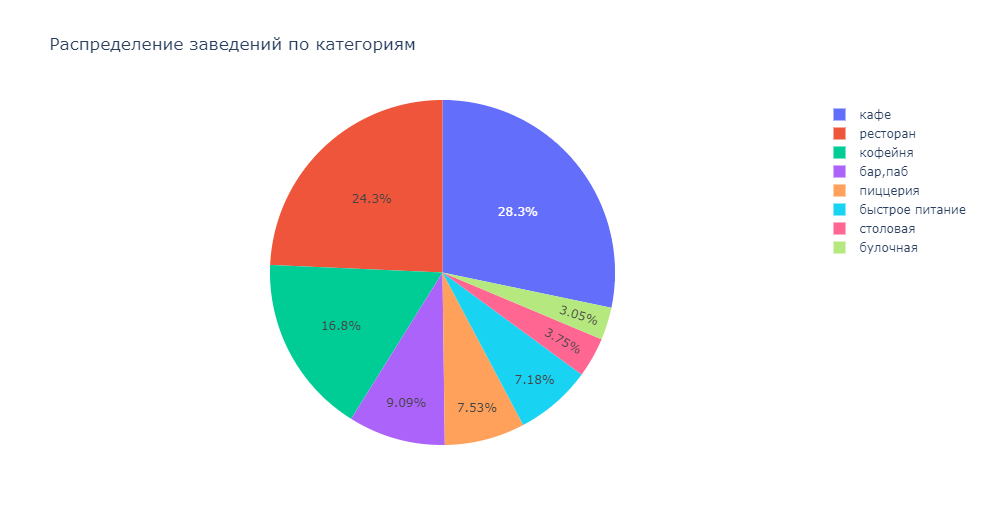

Три категории-лидера — кафе, ресторан, кофейня.

Исследуем количество посадочных мест в заведениях по категориям. Прежде чем считать медианное количество, посмотрим сначала на выбросы.

In [14]:
fig = px.box(data, x='seats', y='category')
fig.update_layout(title_text='Разброс количества посадочных мест по категориям')
fig.show()

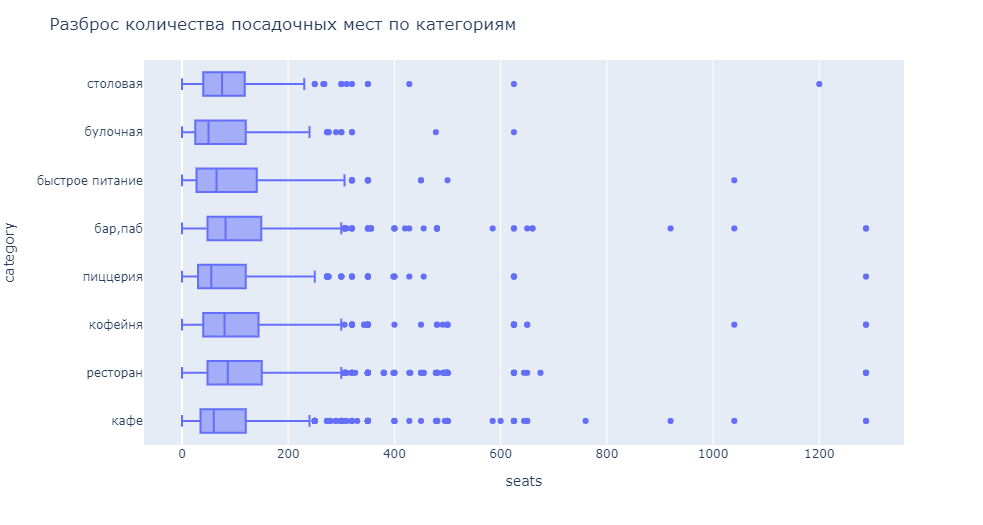

В среднем количество мест больше 300 является выбросами. Посмотрим на медианные значения.

In [15]:
seats = data.groupby('category', as_index=False).agg({'seats': 'median'}).sort_values(by='seats')

fig = px.bar(seats, x='seats', y='category', text='seats', title='Медианное количество посадочных мест по категориям')
fig.show()

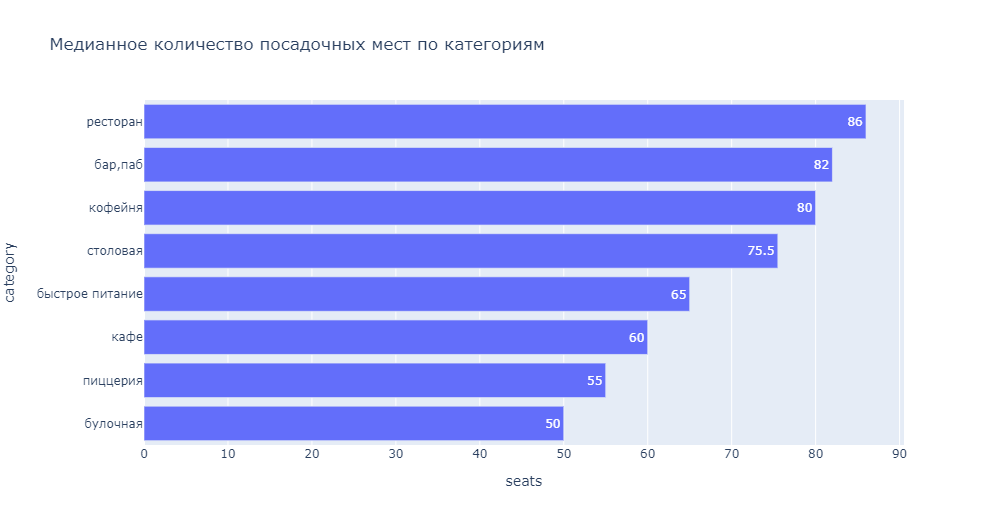

Судя по датасету, наиболее вместительные заведения — рестораны, бары/пабы и кофейни. Наименее — булочные, пиццерии и кафе.

### 2.2 сетевые заведения

Посмотрим на соотношение сетевых и несетевых заведений в датасете.

In [16]:
net = data.groupby('chain', as_index=False).agg({'name':'count'})
net['share'] = round(net['name'] / data['name'].count(), 2)
net.columns = ['chain', 'count', 'share']
net['chain'][0] = 'несетевое'
net['chain'][1] = 'сетевое'
net

,chain,count,share
0,несетевое,5199,0.62
1,сетевое,3203,0.38


Посмотрим, какие категории заведений чаще являются сетевыми.

In [17]:
cat_net = data.pivot_table(index='category', columns='chain', values='name', aggfunc='count')
cat_net['share'] = round(cat_net[1] / (cat_net[0] + cat_net[1]), 2)
cat_net = cat_net.sort_values(by='share', ascending=False).reset_index()
cat_net.columns = ['category', 'non-chain', 'chain', 'share']
cat_net

,category,non-chain,chain,share
0,булочная,99,157,0.61
1,пиццерия,303,330,0.52
2,кофейня,693,720,0.51
3,быстрое питание,371,232,0.38
4,ресторан,1313,729,0.36
5,кафе,1597,779,0.33
6,столовая,227,88,0.28
7,"бар,паб",596,168,0.22


Построим график, в котором категории заведений будут откортированы по принципу от наибольшей доли сетевых заведений к наименьшей.

In [18]:
non_chain = cat_net['non-chain']
chain = cat_net['chain']
category = cat_net['category']

fig = go.Figure(data=[
    go.Bar(name='несетевое', y=non_chain, x=category, text=non_chain),
    go.Bar(name='сетевое', y=chain, x=category, text = chain)])

fig.update_layout(title_text='Количество сетевых и несетевых заведений')              
fig.show()

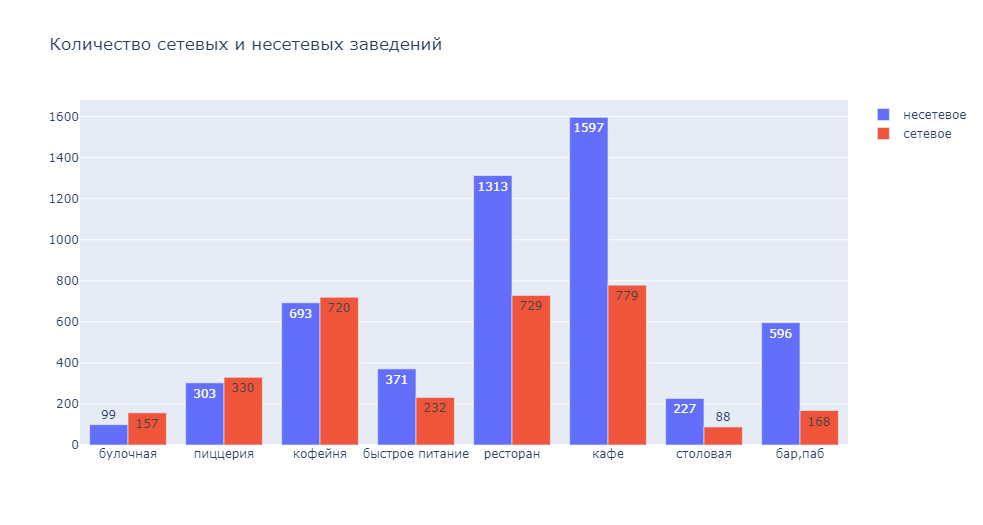

Наиболее часто сетевыми заведениями являются булочные, пиццерии и кофейни. Доли сетевых среди этих заведений превышают доли несетевых. Наименьшее количество сетевых заведений среди баров/пабов и столовых.

Определим топ-15 сетей в Москве по количеству заведений и построим график с визуализацией категорий заведений среди этих сетей.

In [19]:
top15 = (
    data
    .query('chain == 1')
    .groupby(by='name')
    .agg(count=('name','count'))
    .sort_values(by='count', ascending=False)
    .head(15)
    .reset_index()
)
top15_cat = (
    data[data['name'].isin(top15['name'])]
    .groupby(['name', 'category'])
    .agg(count=('name','count'))
    .reset_index()
)

plot(top15_cat, 'name', 'Категории заведений среди топ-15 популярных сетей')

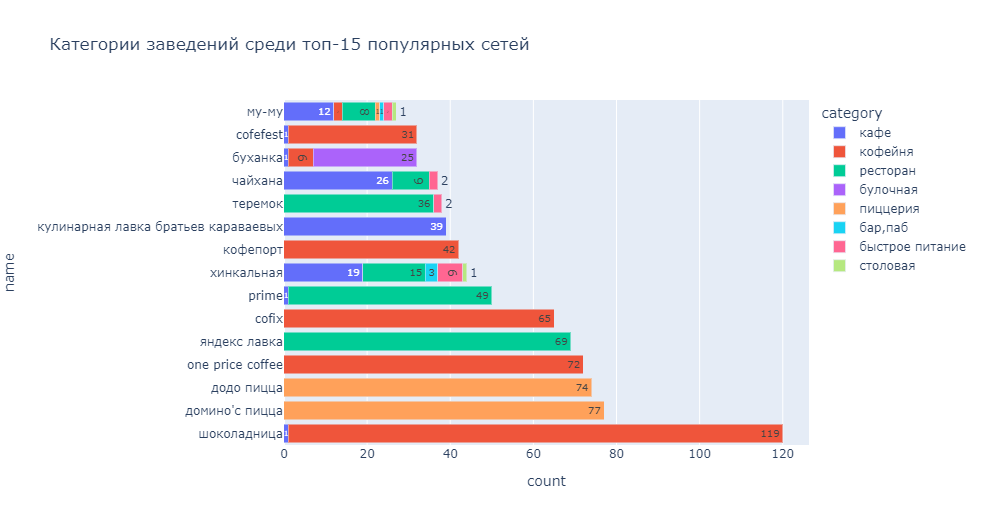

Наиболее популярные сетевые заведения — это кофейни: 5 из 15 сетей. Также можно обратить внимание на сети пиццерий, которые занимают 2 и 3 место.

### 2.3 районы

Посмотрим  на распределение заведений в датасете по административным районам Москвы. Построим график.

In [20]:
district = (
    data
    .groupby(['district', 'category'])
    .agg(count=('name','count'))
    .reset_index()
)

plot(district, 'district', 'Распределение категорий заведений по районам Москвы')

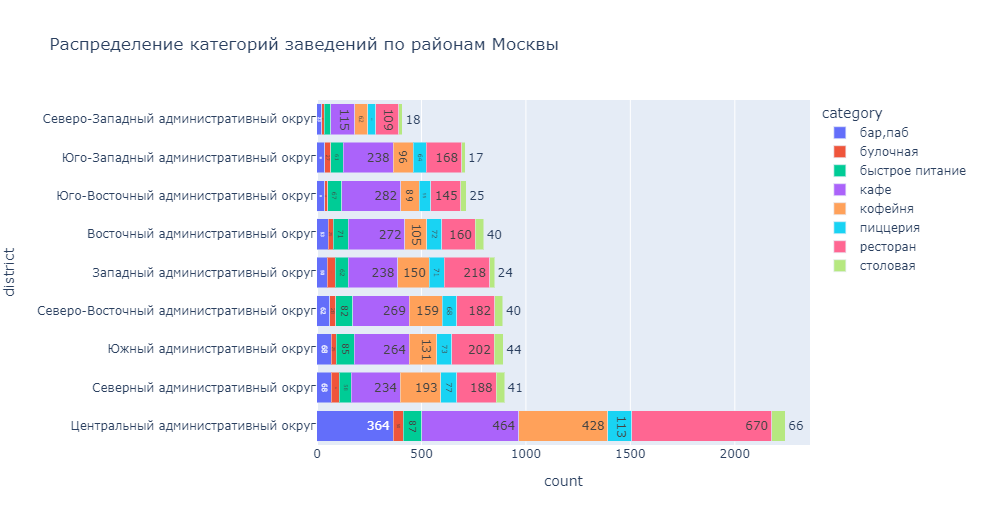

С перевесом более чем в 2 раза по количеству заведений выделяется Центральный административный округ. Три лидирующие категории во всех округах одинаковы: ресторан, кафе, кофейня. При этом в Центральном округе к лидерам приближается категория "бар/паб", тогда как в остальных округах она уступает, например, категории "быстрое питание".

### 2.4 рейтинги

Посмотрим на распределение средних рейтингов по категориям заведений. 

In [21]:
rating_cat = (
    data
    .groupby('category', as_index=False)
    .agg(rating=('rating', 'mean'))
    .sort_values(by='rating', ascending=False)
)
rating_cat['rating'] = round(rating_cat['rating'], 2)
rating_cat

,category,rating
0,"бар,паб",4.39
5,пиццерия,4.30
6,ресторан,4.29
4,кофейня,4.28
1,булочная,4.27
7,столовая,4.21
3,кафе,4.12
2,быстрое питание,4.05


In [22]:
fig = px.bar(rating_cat, 
             x='rating', 
             y='category', 
             text='rating',
             title='Средний рейтинг заведений по категориям')
fig.show()

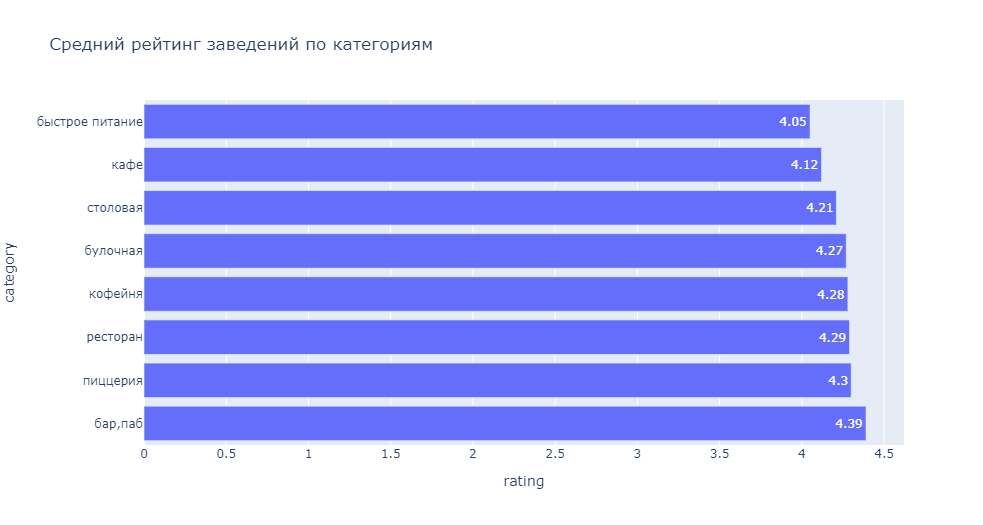

Средний рейтинг по категориям заведений не опускается ниже 4 баллов. В таком виде эта характеристика малоинформативна.

Построим фоновую картограмму со средним рейтингом заведений по районам.

In [23]:
rating_dist = data.groupby('district', as_index='').agg(rating=('rating', 'mean'))

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=rating_dist,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m).geojson.add_child(GeoJsonTooltip(['name'],labels=False));

#m

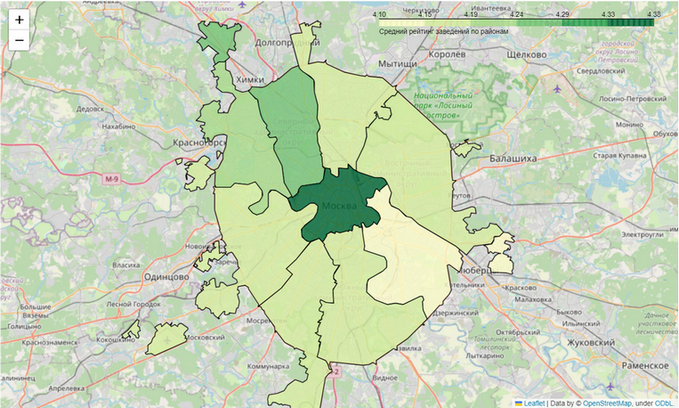

Средние рейтинги заведений по районам тоже различаются незначительно: все значения располагаются между 4.1 и 4.38.

### 2.5 улицы

Отобразим на карте все заведения датасета с помощью кластеров.

In [24]:
m_all = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

marker_cluster = MarkerCluster().add_to(m_all)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)
    
data.apply(create_clusters, axis=1);

#m_all

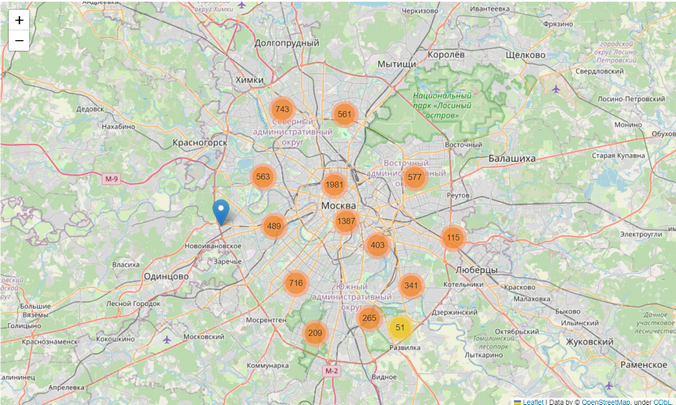

Выведем на график топ-15 улиц по количеству заведений.

In [25]:
streets = (
    data
    .groupby('street')
    .agg(count=('name','count'))
    .sort_values(by='count', ascending=False)
    .reset_index()
)
streets_cat = (
    data[data['street'].isin(streets['street'].head(15))]
    .groupby(['street', 'category'])
    .agg(count=('name','count'))
    .reset_index()
)

plot(streets_cat, 'street', 'Топ-15 улиц по количеству заведений')

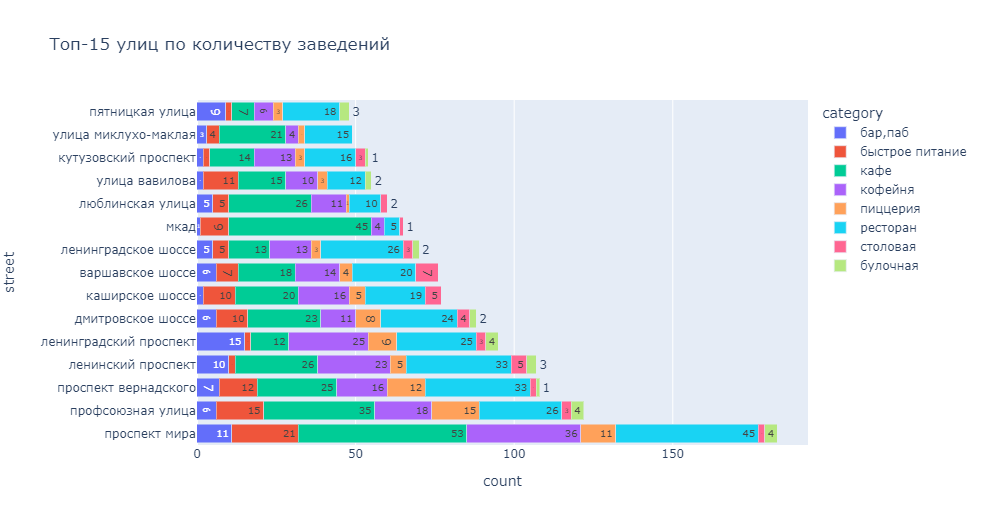

Улица с наибольшим количеством заведений — Проспект Мира, по категориям на ней лидируют кафе, рестораны и кофейни.

Найдем улицы, на которых находится только один объект общепита.

In [26]:
street1 = streets.query('count == 1')
print('Количество улиц, на которых расположено только одно заведение:', street1['street'].count())

Количество улиц, на которых расположено только одно заведение: 457


Посмотрим на средние рейтинги среди таких заведений, которые находятся по одному на улицу, а также на категории, к которым они относятся, и какой процент среди них сетевых.

In [27]:
object1 = (
    data[data['street'].isin(street1['street'])]
    .groupby('category')
    .agg({'name':'count', 'rating': 'mean', 'chain': 'mean'})
    .fillna(0)
    .sort_values(by='name', ascending=False)
    .reset_index()
)
object1

,category,name,rating,chain
0,кафе,159,4.139623,0.270440
1,ресторан,93,4.246237,0.236559
2,кофейня,84,4.307143,0.380952
3,"бар,паб",39,4.479487,0.153846
4,столовая,36,4.261111,0.250000
5,быстрое питание,23,4.082609,0.347826
6,пиццерия,15,4.373333,0.600000
7,булочная,8,4.337500,0.500000


Лидеры по категориям те же самые, что и в общем датасете — кафе, ресторан, кофейня. Средние рейтинги находятся в тех же границах, что и в общем. Особенность можно увидеть в том, что среди таких одиночных общепитов на улице — меньший процент сетевых заведений, чем в целом в такой же категории.

### 2.6 цены

Посмотрим на значения средних чеков заведений по районам Москвы.

In [28]:
bill = data.groupby('district', as_index='').agg({'middle_avg_bill': 'median'})

m_bill = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='Oranges',
    fill_opacity=0.8,
    legend_name='Медиана средних чеков заведений по районам',
).add_to(m_bill).geojson.add_child(GeoJsonTooltip(['name'],labels=False));

#m_bill

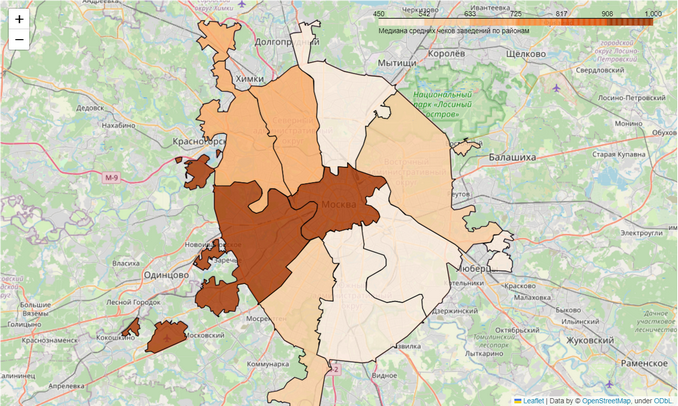

Медиана средних чеков различается значительно: от 450 до 1000 р. Самые дорогие районы — Центральный и Западный. Наиболее демократичные — Северо-Восточный, Южный, Юго-Восточный.

### 2.7 вывод

1. Наиболее популярные категории заведений — кафе, ресторан, кофейня.
2. Наиболее вместительные по медианному количеству мест заведения — рестораны, бары/пабы и кофейни. Наименее — булочные, пиццерии и кафе.
3. Несетевых заведений в датасете 62%, сетевых — 38%. Чаще всего сетевыми заведениями являются булочные, пиццерии и кофейни. Реже всего — бары/пабы и столовые.
4. Среди топ-15 популярных сетей 5 являются сетями кофеен, 2 — сети пиццерий. 
5. Из районов с перевесом более чем в 2 раза по количеству заведений выделяется Центральный административный округ. 
6. Три лидирующие категории во всех округах одинаковы: ресторан, кафе, кофейня. При этом в Центральном округе к лидерам приближается категория "бар/паб", тогда как в остальных округах 4-5 места занимают "быстрое питание" и "пиццерия".
7. Средний рейтинг заведений ни по категориям, ни по районам не опускается ниже 4 баллов. Среди категорий по среднему рейтингу лидируют "бары/пабы", среди районов — Центральный округ.
8. Улица с наибольшим количеством заведений — Проспект Мира, по категориям на ней лидируют кафе, рестораны и кофейни. 
9. В списке топ-улиц по количеству заведений можно обратить внимание на две улицы: Ленинградский проспект и Ленинградское шоссе. На них самая популярная категория в датасете — кафе — занимает не первое место по количеству.
10. В датасете 457 улиц с одним заведением общепита. Среди категории общепитов "единственный на всю улицу" можно отметить меньший процент сетевых заведений, чем в целом в такой же категории.
11. Медиана средних чеков составляет от 450 до 1000 р. в зависимости от района. Самые дорогие районы — Центральный и Западный. Районы с низкими средними чеками — Северо-Восточный, Южный, Юго-Восточный.

## 3 Анализ кофеен

### 3.1 количество кофеен

Подсчитаем количество кофеен.

In [29]:
cafe = data.query('category == "кофейня"')
print('Всего кофеен в датасете:', cafe['name'].count())

Всего кофеен в датасете: 1413


In [30]:
cafe_chain = cafe.groupby('name', as_index=False).agg(count=('address', 'count'))
print('Количество несетевых кофеен:', cafe_chain[cafe_chain['count'] == 1]['name'].count())
print('Количество сетей кофеен:', cafe_chain[cafe_chain['count'] > 1]['name'].count())

Количество несетевых кофеен: 716
Количество сетей кофеен: 110


Посмотрим на распределение кофеен по районам.

In [31]:
cafe_district = cafe.groupby('district', as_index='').agg(count=('name', 'count'))

m_cafe = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=cafe_district,
    columns=['district', 'count'],
    key_on='feature.name',
    fill_color='Greys',
    fill_opacity=0.8,
    legend_name='Медиана средних чеков заведений по районам',
).add_to(m_cafe).geojson.add_child(GeoJsonTooltip(['name'],labels=False));

#m_cafe

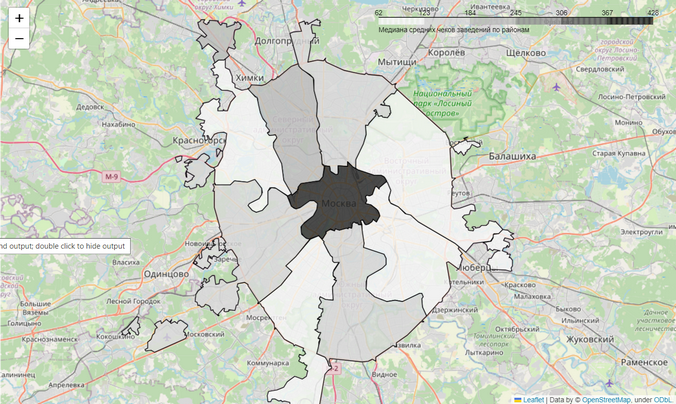

In [32]:
cafe_cluster = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

marker_cluster = MarkerCluster().add_to(cafe_cluster)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)
    
cafe.apply(create_clusters, axis=1);

#cafe_cluster

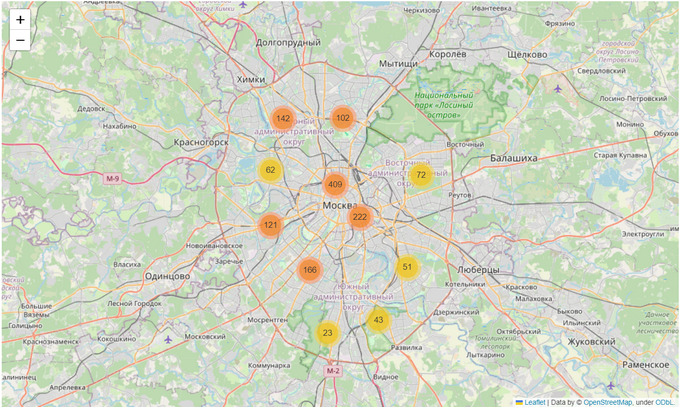

Значительная разница между центром — 428 кофеен — и всеми остальными округами. Меньше всего кофеен в Северо-Западном, Юго-Западном, Восточном, Юго-Восточном округах.

### 3.2 характеристики

Посмотрим, есть ли в дата сете круглосуточные кофейни.

In [33]:
print('Количество круглосуточных кофеен:', cafe[cafe['is_24/7'] == True]['name'].count())

Количество круглосуточных кофеен: 59


Посмотрим на рейтинги кофеен их распределение по районам.

In [34]:
cafe_rating_dist = cafe.groupby('district', as_index='').agg(rating=('rating', 'mean'))

cafe_rating = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=cafe_rating_dist,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(cafe_rating).geojson.add_child(GeoJsonTooltip(['name'],labels=False));

#cafe_rating

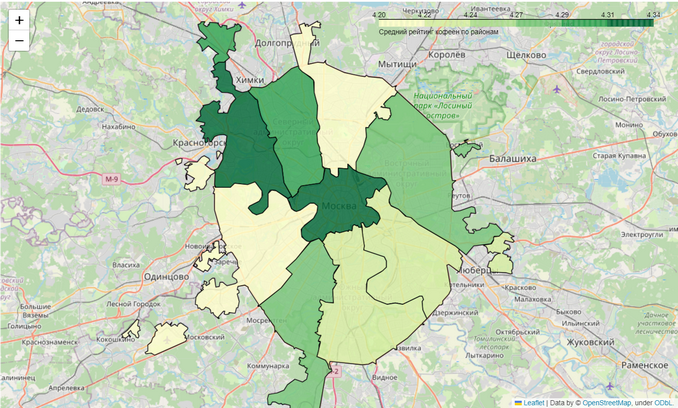

Разница между рейтингами незначительная. Наиболее высокий средний рейтинг — в Центральном и Северо-Западном округах. Наиболее низкий — в Западном и Северо-Восточном.

Оценим медианную стоимость чашки капучино в кофейнях по районам.

In [35]:
cup_district = cafe.groupby('district', as_index='').agg(cup=('middle_coffee_cup', 'median'))

cup = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=cup_district,
    columns=['district', 'cup'],
    key_on='feature.name',
    fill_color='Oranges',
    fill_opacity=0.8,
    legend_name='Средняя стоимость чашки капучино по районам',
).add_to(cup).geojson.add_child(GeoJsonTooltip(['name'],labels=False));

#cup

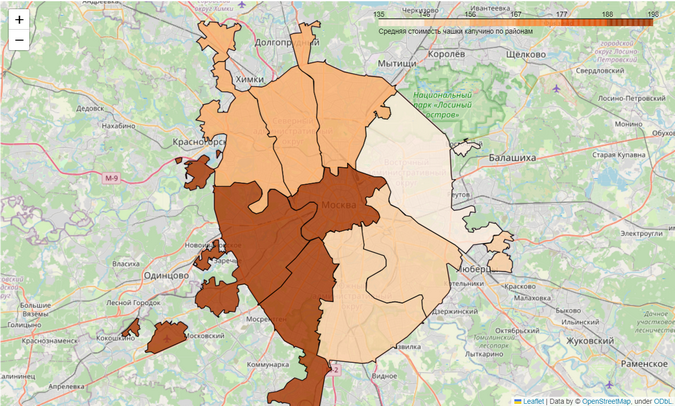

Медианная стоимость чашки капучино по районам колеблется от 135 до 198 руб. Самые высокие медианные цены в Центральном, Западном и Юго-Западном округах. Наиболее низкая медианная цена в Восточном.

### 3.3 вывод

1. Анализ кофеен проведен на следующих данных: всего кофеен в датасете — 1413, среди них несетевых кофеен — 716, сетей кофеен — 110.

2. В распределении кофеен по округам очень большая разница: 428 кофеен в центре и значительно меньше во всех остальных округах. Меньше всего кофеен в Северо-Западном, Юго-Западном, Восточном, Юго-Восточном округах. 

3. 59 кофеен работают круглосуточно и ежедневно.

4. Разница между рейтингами кофеен незначительная. Наиболее высокий средний рейтинг — в Центральном и Северо-Западном округах: 4,34. Наиболее низкий — в Западном и Северо-Восточном: 4,20.

5. Медианная стоимость чашки капучино по районам колеблется от 135 до 198 руб. Самые высокие медианные цены в Центральном, Западном и Юго-Западном округах. Наиболее низкая медианная цена в Восточном.

## 4 Итог и рекомендации

1. Кофейня является третьей по распространенности категорией заведения общепита в Москве — 16,8% заведений.
2. Медианное количество посадочных мест в кофейне — 80. Это высокий показатель, ср: в ресторане — 86, в булочной — 50. 
3. Всего в датасете 1413 кофейни, 51% из них относятся к сетям — 110 сетей. 59 кофеен работают круглосуточно и ежедневно.
4. Сети кофеен популярны: в топ-15 по распространенности входит 5 сетей. "Шоколадница" является лидером с большим отрывом среди всех категорий — 120 заведений. Другие 4 крупные сети — "One price coffee", "Cofix", "Кофепорт", "Cofefest".
5. Средний рейтинг кофейни — 4,28. По округам наиболее высокий в Центральном и Северо-Западном — 4,34. Наиболее низкий — в Западном и Северо-Восточном: 4,20.
6. Наиболее высокие медианные цены за чашку капучино — в Центральном, Западном и Юго-Западном округах. При этом Центральном и Западном наиболее высокие медианы средних чеков в целом по заведениям.
7. Самая низкая медианная цена за чашку капучино — в Восточном округе.


**Рекомендации**

Для открытия кофейни целесообразно выбрать один из округов, где меньше всего представлено кофеен, это: 
- Северо-Западный
- Юго-Западный
- Восточный
- Юго-Восточный. 

При этом в **Северо-Западном** и **Юго-Западном** округах средне-высокие цены на чашку кофе и такие же средне-высокие рейтинги. Можно предположить, что относительно небольшое число кофеен в этих округах работает в целом хорошо и заходить на рынок здесь будет сложнее. Однако если цель — открыть кофейню именно высокого класса, эти округа являются подходящими.

Демократичную кофейню со ставкой на хороший сервис можно открыть в **Восточном** или **Юго-Восточном округе**, где более низкие цены и более низкие рейтинги кофеен. 